<a href="https://colab.research.google.com/github/shaharinv/ML-PROJECT-/blob/main/dogvs_cat_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# installing the Kaggle library
!pip install kaggle

In [ ]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

importing dog vs cat dataset

In [ ]:
# Kaggle api
!kaggle competitions download -c dogs-vs-cats

 99% 807M/812M [00:07<00:00, 196MB/s]
100% 812M/812M [00:07<00:00, 107MB/s]


In [ ]:
!ls

dogs-vs-cats.zip  kaggle.json  sample_data


In [ ]:
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/dogs-vs-cats.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [ ]:
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/train.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [ ]:
import os
# counting the number of files in train folder
path, dirs, files = next(os.walk('/content/train'))
file_count = len(files)
print('Number of images: ', file_count)

Number of images:  25000


printing name of img

In [ ]:
file_names = os.listdir('/content/train/')
print(file_names)

['cat.3366.jpg', 'dog.3006.jpg', 'dog.6714.jpg', 'dog.2188.jpg', 'dog.9613.jpg', 'dog.9645.jpg', 'cat.8567.jpg', 'dog.10626.jpg', 'cat.3544.jpg', 'cat.8764.jpg', 'dog.7471.jpg', 'cat.9535.jpg', 'dog.2012.jpg', 'dog.8311.jpg', 'dog.7963.jpg', 'dog.3852.jpg', 'cat.4917.jpg', 'dog.9754.jpg', 'cat.2996.jpg', 'dog.6413.jpg', 'dog.1214.jpg', 'cat.8343.jpg', 'dog.12153.jpg', 'dog.8725.jpg', 'cat.3439.jpg', 'dog.1671.jpg', 'dog.7440.jpg', 'cat.360.jpg', 'cat.7099.jpg', 'dog.5314.jpg', 'dog.4779.jpg', 'dog.3173.jpg', 'dog.11420.jpg', 'cat.2926.jpg', 'dog.11086.jpg', 'dog.5721.jpg', 'dog.5842.jpg', 'dog.2652.jpg', 'dog.5662.jpg', 'cat.2667.jpg', 'dog.6430.jpg', 'cat.6161.jpg', 'dog.9883.jpg', 'dog.8095.jpg', 'cat.12159.jpg', 'cat.10316.jpg', 'cat.6084.jpg', 'dog.6696.jpg', 'dog.5774.jpg', 'cat.327.jpg', 'cat.6205.jpg', 'dog.11166.jpg', 'dog.9769.jpg', 'dog.8936.jpg', 'dog.1974.jpg', 'dog.2674.jpg', 'cat.6400.jpg', 'cat.4490.jpg', 'dog.10281.jpg', 'dog.1065.jpg', 'cat.2852.jpg', 'cat.11884.jpg', 

importing dependencies

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

display dog, cat img

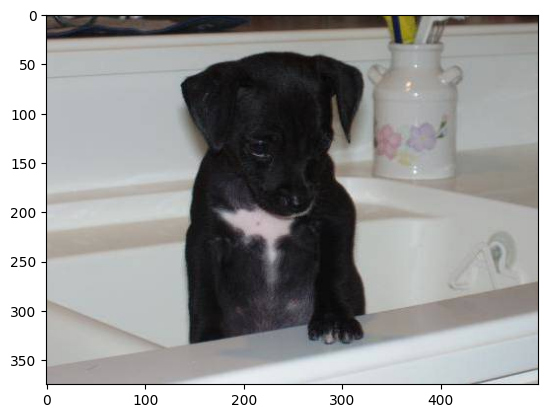

In [ ]:
# display dog image
img = mpimg.imread('/content/train/dog.8298.jpg')
imgplt = plt.imshow(img)
plt.show()

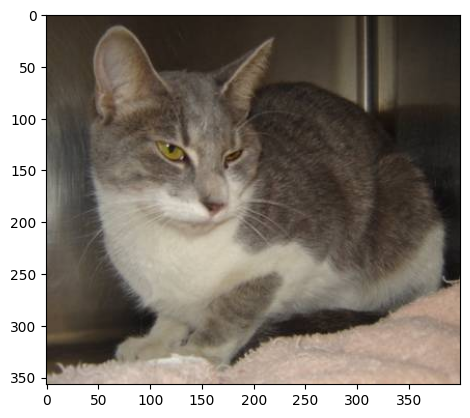

In [ ]:
# display cat image
img = mpimg.imread('/content/train/cat.4352.jpg')
imgplt = plt.imshow(img)
plt.show()


In [ ]:
file_names = os.listdir('/content/train/')

for i in range(5):

  name = file_names[i]
  print(name[0:3])

cat
dog
dog
dog
dog


In [ ]:
file_names = os.listdir('/content/train/')

dog_count = 0
cat_count = 0

for img_file in file_names:

  name = img_file[0:3]

  if name == 'dog':
    dog_count += 1

  else:
    cat_count += 1

print('Number of dog images =', dog_count)
print('Number of cat images =', cat_count)

Number of dog images = 12500
Number of cat images = 12500


Resizing all images

In [ ]:
#creating a directory for resized images
os.mkdir('/content/image resized')

In [ ]:
original_folder = '/content/train/'
resized_folder = '/content/image resized/'

for i in range(2000):

  filename = os.listdir(original_folder)[i]
  img_path = original_folder+filename

  img = Image.open(img_path)
  img = img.resize((224, 224))
  img = img.convert('RGB')

  newImgPath = resized_folder+filename
  img.save(newImgPath)

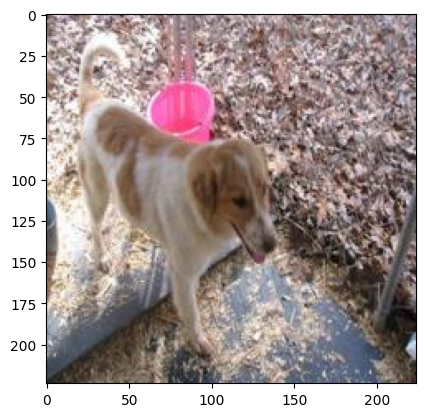

In [ ]:
# display resized dog image
img = mpimg.imread('/content/image resized/dog.3006.jpg')
imgplt = plt.imshow(img)
plt.show()

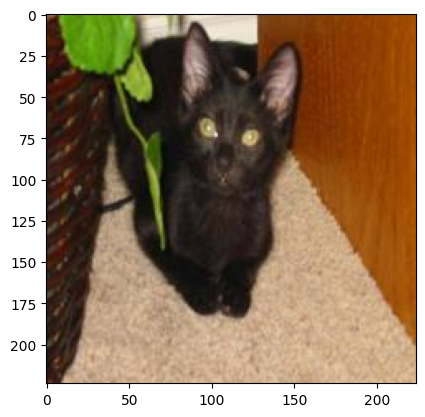

In [ ]:
# display resized cat image
img = mpimg.imread('/content/image resized/cat.3366.jpg')
imgplt = plt.imshow(img)
plt.show()

Creating labels for resized images of dogs and cats

cat  -- 0
dog --1

In [ ]:
# creaing a for loop to assign labels
filenames = os.listdir('/content/image resized/')


labels = []

for i in range(2000):

  file_name = filenames[i]
  label = file_name[0:3]

  if label == 'dog':
    labels.append(1)

  else:
    labels.append(0)

In [ ]:
print(filenames[0:5])
print(len(filenames))

['cat.3366.jpg', 'dog.3006.jpg', 'dog.6714.jpg', 'dog.2188.jpg', 'dog.9613.jpg']
2000


In [ ]:
print(labels[0:5])
print(len(labels))

[0, 1, 1, 1, 1]
2000


In [ ]:
# counting the images of dogs and cats out of 1000 images
values, counts = np.unique(labels, return_counts=True)
print(values)
print(counts)

[0 1]
[ 996 1004]


converting all resized images in to numpy array

In [ ]:
import cv2
import glob

In [ ]:
image_directory = '/content/image resized/'
image_extension = ['png', 'jpg']

files = []

[files.extend(glob.glob(image_directory + '*.' + e)) for e in image_extension]

dog_cat_images = np.asarray([cv2.imread(file) for file in files])

In [ ]:
print(dog_cat_images)

[[[[ 81 121 150]
   [ 77 114 148]
   [ 83 109 155]
   ...
   [  4  79 165]
   [  6  81 167]
   [  7  82 168]]

  [[ 71 109 139]
   [ 70 105 139]
   [ 74 101 145]
   ...
   [  3  78 164]
   [  6  81 167]
   [  6  81 167]]

  [[ 63 100 128]
   [ 60  93 126]
   [ 57  81 123]
   ...
   [  3  78 164]
   [  5  80 166]
   [  5  80 166]]

  ...

  [[  9  22  60]
   [ 14  28  64]
   [ 20  32  66]
   ...
   [147 185 219]
   [147 185 219]
   [141 179 213]]

  [[  3  18  57]
   [ 23  39  76]
   [ 39  51  87]
   ...
   [141 179 213]
   [148 186 220]
   [148 186 220]]

  [[  0  16  55]
   [ 33  49  86]
   [ 54  67 105]
   ...
   [137 175 209]
   [153 191 225]
   [159 197 231]]]


 [[[ 56  64  77]
   [104 112 125]
   [135 138 152]
   ...
   [139 126 148]
   [143 126 153]
   [123 105 134]]

  [[ 48  56  69]
   [ 87  95 108]
   [106 109 123]
   ...
   [143 131 151]
   [161 145 169]
   [153 136 163]]

  [[ 50  58  71]
   [ 84  92 105]
   [101 104 118]
   ...
   [170 158 176]
   [173 158 179]
   [173 157

In [ ]:
type(dog_cat_images)

numpy.ndarray

In [ ]:
print(dog_cat_images.shape)

(2000, 224, 224, 3)


In [ ]:
X = dog_cat_images
Y = np.asarray(labels)

Train Test split

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [ ]:
print(X.shape, X_train.shape, X_test.shape)

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


1600 - training data
, 400 - testing data

In [ ]:
# scaling the data
X_train_scaled = X_train/250

X_test_scaled = X_test/250

In [ ]:
print(X_train_scaled)

[[[[0.028 0.028 0.028]
   [0.024 0.024 0.024]
   [0.02  0.02  0.02 ]
   ...
   [0.02  0.02  0.02 ]
   [0.016 0.016 0.016]
   [0.012 0.012 0.012]]

  [[0.02  0.02  0.02 ]
   [0.024 0.024 0.024]
   [0.028 0.028 0.028]
   ...
   [0.02  0.02  0.02 ]
   [0.016 0.016 0.016]
   [0.012 0.012 0.012]]

  [[0.02  0.02  0.02 ]
   [0.024 0.024 0.024]
   [0.032 0.032 0.032]
   ...
   [0.02  0.02  0.02 ]
   [0.016 0.016 0.016]
   [0.016 0.016 0.016]]

  ...

  [[0.896 0.932 0.972]
   [0.888 0.924 0.964]
   [0.892 0.924 0.976]
   ...
   [0.944 0.944 0.992]
   [0.944 0.944 0.992]
   [0.944 0.944 0.992]]

  [[0.912 0.94  0.976]
   [0.9   0.924 0.968]
   [0.892 0.924 0.976]
   ...
   [0.944 0.944 0.992]
   [0.944 0.944 0.992]
   [0.944 0.944 0.992]]

  [[0.912 0.94  0.976]
   [0.896 0.924 0.96 ]
   [0.884 0.916 0.968]
   ...
   [0.948 0.948 0.996]
   [0.952 0.952 1.   ]
   [0.956 0.956 1.004]]]


 [[[0.408 0.432 0.412]
   [0.384 0.412 0.384]
   [0.392 0.412 0.376]
   ...
   [0.148 0.152 0.192]
   [0.152 

building neural network

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4

In [ ]:
mobilenet_model = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4'

pretrained_model = hub.KerasLayer(mobilenet_model, input_shape=(224,224,3), trainable=False)

In [ ]:
num_of_classes = 2

model = tf.keras.Sequential([

    pretrained_model,
    tf.keras.layers.Dense(num_of_classes)

])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 2)                 2004      
                                                                 
Total params: 3542269 (13.51 MB)
Trainable params: 2004 (7.83 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


In [ ]:
model.compile(
    optimizer = 'adam',
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics = ['acc']
)

In [ ]:
model.fit(X_train_scaled, Y_train, epochs=5)

Epoch 1/5
50/50 [==============================] - 75s 1s/step - loss: 0.2349 - acc: 0.8963
Epoch 2/5
50/50 [==============================] - 67s 1s/step - loss: 0.0628 - acc: 0.9794
Epoch 3/5
50/50 [==============================] - 67s 1s/step - loss: 0.0444 - acc: 0.9862
Epoch 4/5
50/50 [==============================] - 70s 1s/step - loss: 0.0349 - acc: 0.9881
Epoch 5/5
50/50 [==============================] - 67s 1s/step - loss: 0.0270 - acc: 0.9931


In [ ]:
score, acc = model.evaluate(X_test_scaled, Y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

13/13 [==============================] - 25s 2s/step - loss: 0.0790 - acc: 0.9750
Test Loss = 0.07895074039697647
Test Accuracy = 0.9750000238418579


predictive systm

Path of the image to be predicted: /content/dog.jpg


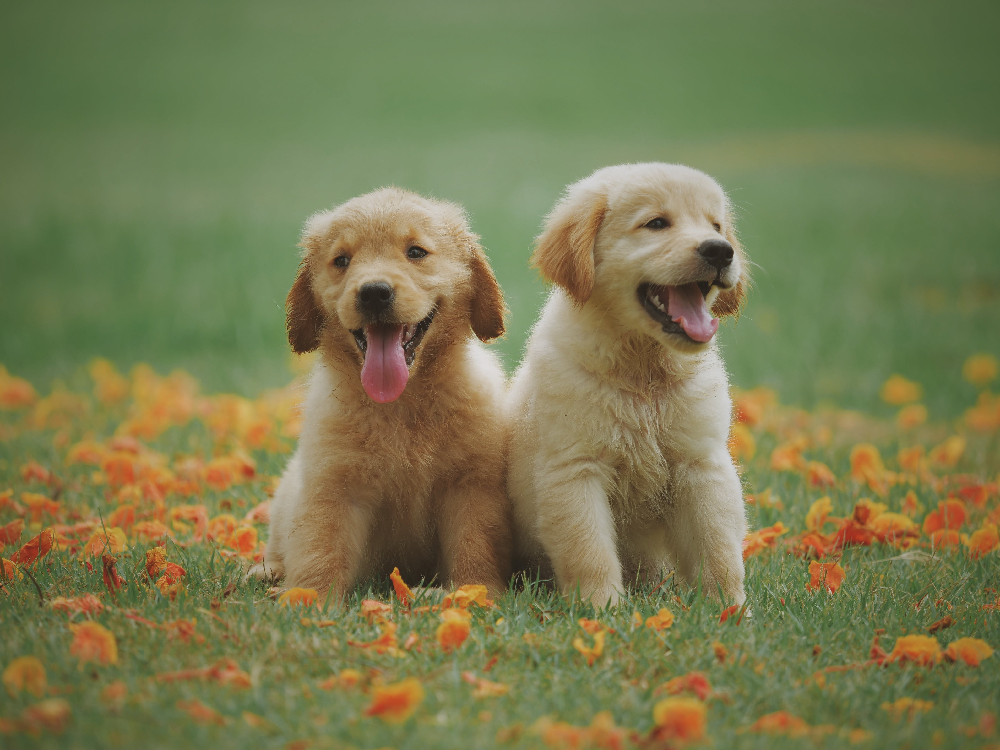

1/1 [==============================] - 1s 882ms/step
[[1.2453955 2.9231164]]
1
The image represents a Dog


In [ ]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')